<a href="https://colab.research.google.com/github/annapo28/Migration-Model/blob/main/VizualizationAmericanWoodcock.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
pip install mplcursors

In [ ]:
pip install "vegafusion[embed]>=1.5.0"
pip install "vl-convert-python>=1.6.0"
pip install topojson


# Модель

Начальное распределение, распределение по точкам вылета, boxplot и эксперименты с треками, а также сравнение паттернов для American Woodcock.

# Начальное распределение

## Гнездование

In [76]:
import json
import folium
import numpy as np
from branca.colormap import linear

with open('grid_data.json', 'r') as file:
    data = json.load(file)

def create_map(data, season):
    filtered_data = [point for point in data if point["season"] == season]

    if not filtered_data:
        print(f"⚠ No data found for season: {season}")
        return folium.Map(location=[0, 0], zoom_start=2)

    all_latitudes = [point["latitude"] for point in filtered_data]
    all_longitudes = [point["longitude"] for point in filtered_data]
    map_center = [np.mean(all_latitudes), np.mean(all_longitudes)]

    m = folium.Map(location=map_center, zoom_start=6)

    values = [point["abundance"] for point in filtered_data]
    log_values = np.log10(np.array(values) + 1e-100)

    colormap_min = np.min(log_values)
    colormap_max = np.max(log_values)
    print(f"Color scale range: {colormap_min:.2f} to {colormap_max:.2f}")

    colormap = linear.RdYlBu_09.scale(colormap_min, colormap_max)
    colormap.caption = f'Log10(Abundance) - {season.capitalize()}'

    for point, log_value in zip(filtered_data, log_values):
        latitude = point["latitude"]
        longitude = point["longitude"]
        color = colormap(log_value)

        folium.CircleMarker(
            location=[latitude, longitude],
            radius=8,
            color=color,
            fill=True,
            fill_color=color,
            fill_opacity=0.7,
            popup=f"Abundance: {point['abundance']:.10f}\nLat: {latitude:.4f}\nLon: {longitude:.4f}"
        ).add_to(m)

    return m, colormap

breeding_map, breeding_colormap = create_map(data, "breeding")

breeding_colormap.add_to(breeding_map)

breeding_map

Color scale range: -7.14 to -1.40


## Зимовка

In [77]:
import folium
import numpy as np
from branca.colormap import linear
import json


with open('grid_data.json', 'r') as file:
    data = json.load(file)


def create_map(data, season):

    filtered_data = [point for point in data if point["season"] == season]

    if not filtered_data:
        print(f"⚠ No data found for season: {season}")
        return folium.Map(location=[0, 0], zoom_start=2)


    all_latitudes = [point["latitude"] for point in filtered_data]
    all_longitudes = [point["longitude"] for point in filtered_data]
    map_center = [np.mean(all_latitudes), np.mean(all_longitudes)]


    m = folium.Map(location=map_center, zoom_start=6)

    values = [point["abundance"] for point in filtered_data]
    log_values = np.log10(np.array(values) + 1e-100)

    colormap_min = np.min(log_values)
    colormap_max = np.max(log_values)
    print(colormap_max, colormap_min)

    colormap = linear.RdYlBu_09.scale(colormap_min, colormap_max)

    for point, log_value in zip(filtered_data, log_values):
        latitude = point["latitude"]
        longitude = point["longitude"]
        color = colormap(log_value)

        folium.CircleMarker(
            location=[latitude, longitude],
            radius=8,
            color=color,
            fill=True,
            fill_color=color,
            fill_opacity=0.7,
            popup=f"Abundance: {point['abundance'], latitude, longitude}"
        ).add_to(m)

    colormap.caption = 'Log10(Value Scale)'
    colormap.add_to(m)

    return m



# breeding_map = create_map(data, "breeding")
# breeding_map
wintering_map = create_map(data, "wintering")
wintering_map





-0.5373145531733281 -4.708275442720316


# Весенная миграция


## Распределение по координатам вылета

In [78]:
import folium
import json
import ipywidgets as widgets
from ipywidgets import interact
from branca.colormap import linear
import numpy as np

# Загружаем данные из файла
with open('migration_probabilities.json', 'r') as file:
    data = json.load(file)

keys = list(data.keys())

def show_map(key):
    points = data[key]

    points = sorted(points, key=lambda point: float(point[0].split(',')[1]))

    map_center = [float(key.split(',')[0]), float(key.split(',')[1])]
    m = folium.Map(location=map_center, zoom_start=4)

    values = [point[1] for point in points]
    min_value = min(values)
    max_value = max(values)

    log_values = np.log10(np.array(values) + 1e-100)

    colormap_min = np.min(log_values)
    colormap_max = np.max(log_values)

    colormap = linear.RdYlBu_09.scale(colormap_min, colormap_max)

    for point, log_value in zip(points, log_values):
        coord = point[0].split(',')
        latitude = float(coord[0])
        longitude = float(coord[1])

        color = colormap(log_value)

        folium.CircleMarker(
            location=[latitude, longitude],
            radius=5,
            color=color,
            fill=True,
            fill_color=color,
            fill_opacity=0.7
        ).add_to(m)

    selected_lat, selected_lon = map(float, key.split(','))
    folium.Marker(
        location=[selected_lat, selected_lon],
        popup=f"Selected Key: {key}",
        icon=folium.Icon(color='green', icon='star')
    ).add_to(m)

    colormap.caption = 'Log10(Value Scale)'
    colormap.add_to(m)

    return m

dropdown = widgets.Dropdown(
    options=keys,
    description='Select Key:',
    disabled=False
)

interact(show_map, key=dropdown)

interactive(children=(Dropdown(description='Select Key:', options=('39.5,-74.5', '38.5,-75.5', '37.5,-87.5', '…

<function __main__.show_map(key)>

## Невязка в ареалах

In [79]:
import folium
import numpy as np
import json
from branca.colormap import linear

with open('/content/breeding_discrepancy.json', 'r') as file:
    data = json.load(file)

formatted_data = [
    {"latitude": float(key.split(',')[0]), "longitude": float(key.split(',')[1]), "abundance": value}
    for key, value in data.items()
]

def create_wintering_map(data):
    if not data:
        print("⚠ No data found!")
        return folium.Map(location=[0, 0], zoom_start=2)

    all_latitudes = [point["latitude"] for point in data]
    all_longitudes = [point["longitude"] for point in data]
    map_center = [np.mean(all_latitudes), np.mean(all_longitudes)]

    m = folium.Map(location=map_center, zoom_start=6)

    values = [point["abundance"] for point in data]
    values = np.array(values)
    values[values <= 0] = 1e-300
    print(max(values))

    log_values = np.log10(values)
    log_values = log_values[~np.isnan(log_values)]
    log_values = log_values[~np.isinf(log_values)]

    if len(log_values) == 0:
        print("⚠ No valid data points after filtering!")
        return folium.Map(location=[0, 0], zoom_start=2)

    log_values_sorted = np.sort(log_values)
    colormap_min = -10
    colormap_max = np.max(log_values)

    colormap = linear.RdYlBu_09.scale(colormap_min, colormap_max)

    if colormap_min == colormap_max:
        colormap_max += 1e-10


    for point, log_value in zip(data, log_values):
        latitude = point["latitude"]
        longitude = point["longitude"]
        color = colormap(log_value)

        folium.CircleMarker(
            location=[latitude, longitude],
            radius=6,
            color=color,
            fill=True,
            fill_color=color,
            fill_opacity=0.7,
            popup=f"Abundance: {point['abundance']:.8f}, lat: {point['latitude']}, lon: {point['longitude']}"
        ).add_to(m)

    colormap.caption = 'Log10(Abundance) - Wintering'
    colormap.add_to(m)

    return m

wintering_map = create_wintering_map(formatted_data)
wintering_map

0.02253844177166631


In [80]:
import folium
import numpy as np
import json
from branca.colormap import linear

with open('/content/wintering_discrepancy.json', 'r') as file:
    data = json.load(file)

formatted_data = [
    {"latitude": float(key.split(',')[0]), "longitude": float(key.split(',')[1]), "abundance": value}
    for key, value in data.items()
]

def create_wintering_map(data):
    if not data:
        print("⚠ No data found!")
        return folium.Map(location=[0, 0], zoom_start=2)

    all_latitudes = [point["latitude"] for point in data]
    all_longitudes = [point["longitude"] for point in data]
    map_center = [np.mean(all_latitudes), np.mean(all_longitudes)]

    m = folium.Map(location=map_center, zoom_start=6)

    values = [point["abundance"] for point in data]
    values = np.array(values)
    print(min(values))
    values[values <= 0] = 1e-300

    log_values = np.log10(values)
    log_values = log_values[~np.isnan(log_values)]
    log_values = log_values[~np.isinf(log_values)]

    if len(log_values) == 0:
        print("⚠ No valid data points after filtering!")
        return folium.Map(location=[0, 0], zoom_start=2)

    log_values_sorted = np.sort(log_values)
    colormap_min = np.min(log_values_sorted)
    colormap_max = np.max(log_values_sorted)

    if colormap_min == colormap_max:
        colormap_max += 1e-10

    colormap = linear.RdYlBu_09.scale(colormap_min, colormap_max)

    for point, log_value in zip(data, log_values):
        latitude = point["latitude"]
        longitude = point["longitude"]
        color = colormap(log_value)

        folium.CircleMarker(
            location=[latitude, longitude],
            radius=6,
            color=color,
            fill=True,
            fill_color=color,
            fill_opacity=0.7,
            popup=f"Abundance: {point['abundance']:.8f}, lat: {point['latitude']}, lon: {point['longitude']}"
        ).add_to(m)

    colormap.caption = 'Log10(Abundance) - Wintering'
    colormap.add_to(m)

    return m

wintering_map = create_wintering_map(formatted_data)
wintering_map

7.7098240812467085e-252


# Осенная миграция

## Распределение по координатам вылета

In [81]:
import folium
import json
import ipywidgets as widgets
from ipywidgets import interact
from branca.colormap import linear
import numpy as np


with open('migration_probabilities_fall.json', 'r') as file:
    data = json.load(file)


keys = sorted(data.keys(), key=lambda key: float(key.split(',')[0]))
print(keys)
def show_map(key):

    points = data[key]

    points = sorted(points, key=lambda point: float(point[0].split(',')[1]))

    map_center = [float(key.split(',')[0]), float(key.split(',')[1])]
    m = folium.Map(location=map_center, zoom_start=2)

    values = [point[1] for point in points]
    min_value = min(values)
    max_value = max(values)

    log_values = np.log10(np.array(values) + 1e-100)

    colormap_min = np.min(log_values)
    colormap_max = np.max(log_values)
    print(colormap_max, colormap_min)

    colormap = linear.RdYlBu_09.scale(colormap_min, colormap_max)

    for point, log_value in zip(points, log_values):
        coord = point[0].split(',')
        latitude = float(coord[0])
        longitude = float(coord[1])

        color = colormap(log_value)

        folium.CircleMarker(
            location=[latitude, longitude],
            radius=5,
            color=color,
            fill=True,
            fill_color=color,
            fill_opacity=0.7,
            popup=f"Value: {point[1]:.10f}"
        ).add_to(m)

    selected_lat, selected_lon = map(float, key.split(','))
    folium.Marker(
        location=[selected_lat, selected_lon],
        popup=f"Selected Key: {key}",
        icon=folium.Icon(color='green', icon='star')
    ).add_to(m)

    colormap.caption = 'Scaled Value Scale'
    colormap.add_to(m)

    return m

dropdown = widgets.Dropdown(
    options=keys,
    description='Select Key:',
    disabled=False
)


interact(show_map, key=dropdown)

['37.5,-86.5', '38.5,-76.5', '38.5,-84.5', '38.5,-77.5', '38.5,-73.5', '38.5,-78.5', '38.5,-86.5', '38.5,-85.5', '38.5,-79.5', '39.5,-73.5', '39.5,-76.5', '39.5,-77.5', '39.5,-83.5', '39.5,-78.5', '39.5,-85.5', '39.5,-82.5', '39.5,-81.5', '40.5,-74.5', '40.5,-73.5', '40.5,-76.5', '40.5,-77.5', '40.5,-84.5', '40.5,-78.5', '40.5,-82.5', '40.5,-79.5', '40.5,-72.5', '41.5,-74.5', '41.5,-73.5', '41.5,-76.5', '41.5,-75.5', '41.5,-77.5', '41.5,-78.5', '41.5,-87.5', '41.5,-84.5', '41.5,-86.5', '41.5,-85.5', '41.5,-79.5', '41.5,-69.5', '41.5,-81.5', '41.5,-70.5', '41.5,-68.5', '41.5,-80.5', '41.5,-82.5', '41.5,-72.5', '41.5,-71.5', '42.5,-74.5', '42.5,-73.5', '42.5,-76.5', '42.5,-77.5', '42.5,-75.5', '42.5,-78.5', '42.5,-79.5', '42.5,-84.5', '42.5,-87.5', '42.5,-88.5', '42.5,-83.5', '42.5,-89.5', '42.5,-86.5', '42.5,-82.5', '42.5,-80.5', '42.5,-85.5', '42.5,-81.5', '42.5,-95.5', '42.5,-69.5', '42.5,-71.5', '42.5,-72.5', '42.5,-70.5', '43.5,-74.5', '43.5,-75.5', '43.5,-76.5', '43.5,-77.5', '43.5

interactive(children=(Dropdown(description='Select Key:', options=('37.5,-86.5', '38.5,-76.5', '38.5,-84.5', '…

<function __main__.show_map(key)>

## Невязка в ареалах

In [ ]:
import folium
import numpy as np
import json
from branca.colormap import linear

with open('/content/wintering_discrepancy_fall.json', 'r') as file:
    data = json.load(file)

formatted_data = [
    {"latitude": float(key.split(',')[0]), "longitude": float(key.split(',')[1]), "abundance": value}
    for key, value in data.items()
]

def create_wintering_map(data):
    if not data:
        print("⚠ No data found!")
        return folium.Map(location=[0, 0], zoom_start=2)

    all_latitudes = [point["latitude"] for point in data]
    all_longitudes = [point["longitude"] for point in data]
    map_center = [np.mean(all_latitudes), np.mean(all_longitudes)]

    m = folium.Map(location=map_center, zoom_start=6)

    values = [point["abundance"] for point in data]

    log_values = np.log10(np.array(values) + 1e-100)

    colormap_min = -75
    colormap_max = np.max(log_values)

    colormap = linear.RdYlBu_09.scale(colormap_min, colormap_max)

    for point, log_value in zip(data, log_values):
        latitude = point["latitude"]
        longitude = point["longitude"]
        color = colormap(log_value)

        folium.CircleMarker(
            location=[latitude, longitude],
            radius=6,
            color=color,
            fill=True,
            fill_color=color,
            fill_opacity=0.7,
            popup=f"Abundance: {point['abundance']:.8f}, lat: {point['latitude']}, lon: {point['longitude']}"
        ).add_to(m)


    colormap.caption = 'Log10(Abundance) - Wintering'
    colormap.add_to(m)

    return m

wintering_map = create_wintering_map(formatted_data)


wintering_map


In [ ]:
import folium
import numpy as np
import json
from branca.colormap import linear

with open('/content/breeding_discrepancy_fall.json', 'r') as file:
    data = json.load(file)

formatted_data = [
    {"latitude": float(key.split(',')[0]), "longitude": float(key.split(',')[1]), "abundance": value}
    for key, value in data.items()
]

def create_wintering_map(data):
    if not data:
        print("⚠ No data found!")
        return folium.Map(location=[0, 0], zoom_start=2)

    all_latitudes = [point["latitude"] for point in data]
    all_longitudes = [point["longitude"] for point in data]
    map_center = [np.mean(all_latitudes), np.mean(all_longitudes)]

    m = folium.Map(location=map_center, zoom_start=6)

    values = [point["abundance"] for point in data]
    values = np.array(values)
    values[values <= 0] = 1e-300

    log_values = np.log10(values)
    log_values = log_values[~np.isnan(log_values)]
    log_values = log_values[~np.isinf(log_values)]

    if len(log_values) == 0:
        print("⚠ No valid data points after filtering!")
        return folium.Map(location=[0, 0], zoom_start=2)

    log_values_sorted = np.sort(log_values)
    colormap_min = -10
    colormap_max = np.max(log_values)

    colormap = linear.RdYlBu_09.scale(colormap_min, colormap_max)

    if colormap_min == colormap_max:
        colormap_max += 1e-10


    for point, log_value in zip(data, log_values):
        latitude = point["latitude"]
        longitude = point["longitude"]
        color = colormap(log_value)

        folium.CircleMarker(
            location=[latitude, longitude],
            radius=6,
            color=color,
            fill=True,
            fill_color=color,
            fill_opacity=0.7,
            popup=f"Abundance: {point['abundance']:.8f}, lat: {point['latitude']}, lon: {point['longitude']}"
        ).add_to(m)

    colormap.caption = 'Log10(Abundance) - Wintering'
    colormap.add_to(m)

    return m

wintering_map = create_wintering_map(formatted_data)
wintering_map

# Цепная весенняя миграция

## Распределения по квадратам вылета

In [84]:
import folium
import json
import ipywidgets as widgets
from ipywidgets import interact
from branca.colormap import linear
import numpy as np

# Загружаем данные из файла
with open('chain_migration_weights.json', 'r') as file:
    data = json.load(file)

keys = list(data.keys())

def show_map(key):
    points = data[key]

    points = sorted(points, key=lambda point: float(point[0].split(',')[1]))

    map_center = [float(key.split(',')[0]), float(key.split(',')[1])]
    m = folium.Map(location=map_center, zoom_start=4)

    values = [point[1] for point in points]
    min_value = min(values)
    max_value = max(values)

    log_values = np.log10(np.array(values) + 1e-100)

    colormap_min = np.min(log_values)
    colormap_max = np.max(log_values)

    colormap = linear.RdYlBu_09.scale(colormap_min, colormap_max)

    for point, log_value in zip(points, log_values):
        coord = point[0].split(',')
        latitude = float(coord[0])
        longitude = float(coord[1])

        color = colormap(log_value)

        folium.CircleMarker(
            location=[latitude, longitude],
            radius=5,
            color=color,
            fill=True,
            fill_color=color,
            fill_opacity=0.7
        ).add_to(m)

    selected_lat, selected_lon = map(float, key.split(','))
    folium.Marker(
        location=[selected_lat, selected_lon],
        popup=f"Selected Key: {key}",
        icon=folium.Icon(color='green', icon='star')
    ).add_to(m)

    colormap.caption = 'Log10(Value Scale)'
    colormap.add_to(m)

    return m

dropdown = widgets.Dropdown(
    options=keys,
    description='Select Key:',
    disabled=False
)

interact(show_map, key=dropdown)

interactive(children=(Dropdown(description='Select Key:', options=('28.5,-81.5', '28.5,-80.5', '29.5,-90.5', '…

<function __main__.show_map(key)>

## Невязка по арелалам

In [85]:
import folium
import numpy as np
import json
from branca.colormap import linear

with open('/content/chain_breeding_discrepancy.json', 'r') as file:
    data = json.load(file)

formatted_data = [
    {"latitude": float(key.split(',')[0]), "longitude": float(key.split(',')[1]), "abundance": value}
    for key, value in data.items()
]

def create_wintering_map(data):
    if not data:
        print("⚠ No data found!")
        return folium.Map(location=[0, 0], zoom_start=2)

    all_latitudes = [point["latitude"] for point in data]
    all_longitudes = [point["longitude"] for point in data]
    map_center = [np.mean(all_latitudes), np.mean(all_longitudes)]

    m = folium.Map(location=map_center, zoom_start=6)

    values = [point["abundance"] for point in data]
    values = np.array(values)
    values[values <= 0] = 1e-300

    log_values = np.log10(values)
    log_values = log_values[~np.isnan(log_values)]
    log_values = log_values[~np.isinf(log_values)]

    if len(log_values) == 0:
        print("⚠ No valid data points after filtering!")
        return folium.Map(location=[0, 0], zoom_start=2)

    log_values_sorted = np.sort(log_values)
    colormap_min = -10
    colormap_max = np.max(log_values)

    colormap = linear.RdYlBu_09.scale(colormap_min, colormap_max)

    if colormap_min == colormap_max:
        colormap_max += 1e-10


    for point, log_value in zip(data, log_values):
        latitude = point["latitude"]
        longitude = point["longitude"]
        color = colormap(log_value)

        folium.CircleMarker(
            location=[latitude, longitude],
            radius=6,
            color=color,
            fill=True,
            fill_color=color,
            fill_opacity=0.7,
            popup=f"Abundance: {point['abundance']:.8f}, lat: {point['latitude']}, lon: {point['longitude']}"
        ).add_to(m)

    colormap.caption = 'Log10(Abundance) - Wintering'
    colormap.add_to(m)

    return m

wintering_map = create_wintering_map(formatted_data)
wintering_map

In [86]:
import folium
import numpy as np
import json
from branca.colormap import linear

with open('/content/chain_wintering_discrepancy.json', 'r') as file:
    data = json.load(file)

formatted_data = [
    {"latitude": float(key.split(',')[0]), "longitude": float(key.split(',')[1]), "abundance": value}
    for key, value in data.items()
]

def create_wintering_map(data):
    if not data:
        print("⚠ No data found!")
        return folium.Map(location=[0, 0], zoom_start=2)

    all_latitudes = [point["latitude"] for point in data]
    all_longitudes = [point["longitude"] for point in data]
    map_center = [np.mean(all_latitudes), np.mean(all_longitudes)]

    m = folium.Map(location=map_center, zoom_start=6)

    values = [point["abundance"] for point in data]
    values = np.array(values)
    values[values <= 0] = 1e-300

    log_values = np.log10(values)
    log_values = log_values[~np.isnan(log_values)]
    log_values = log_values[~np.isinf(log_values)]

    if len(log_values) == 0:
        print("⚠ No valid data points after filtering!")
        return folium.Map(location=[0, 0], zoom_start=2)

    log_values_sorted = np.sort(log_values)
    colormap_min = np.min(log_values_sorted)
    colormap_max = np.max(log_values_sorted)

    if colormap_min == colormap_max:
        colormap_max += 1e-10

    colormap = linear.RdYlBu_09.scale(colormap_min, colormap_max)

    for point, log_value in zip(data, log_values):
        latitude = point["latitude"]
        longitude = point["longitude"]
        color = colormap(log_value)

        folium.CircleMarker(
            location=[latitude, longitude],
            radius=6,
            color=color,
            fill=True,
            fill_color=color,
            fill_opacity=0.7,
            popup=f"Abundance: {point['abundance']:.8f}, lat: {point['latitude']}, lon: {point['longitude']}"
        ).add_to(m)

    colormap.caption = 'Log10(Abundance) - Wintering'
    colormap.add_to(m)

    return m

wintering_map = create_wintering_map(formatted_data)
wintering_map

#Цепная осенняя миграция

In [87]:
import folium
import json
import ipywidgets as widgets
from ipywidgets import interact
from branca.colormap import linear
import numpy as np


with open('chain_migration_probabilities_fall.json', 'r') as file:
    data = json.load(file)

keys = sorted(data.keys(), key=lambda key: float(key.split(',')[0]), reverse = True)
print(keys)
def show_map(key):

    points = data[key]

    points = sorted(points, key=lambda point: float(point[0].split(',')[1]))

    map_center = [float(key.split(',')[0]), float(key.split(',')[1])]
    m = folium.Map(location=map_center, zoom_start=2)

    values = [point[1] for point in points]
    min_value = min(values)
    max_value = max(values)

    log_values = np.log10(np.array(values) + 1e-100)

    colormap_min = np.min(log_values)
    colormap_max = np.max(log_values)
    print(colormap_max, colormap_min)

    colormap = linear.RdYlBu_09.scale(colormap_min, colormap_max)

    for point, log_value in zip(points, log_values):
        coord = point[0].split(',')
        latitude = float(coord[0])
        longitude = float(coord[1])

        color = colormap(log_value)

        folium.CircleMarker(
            location=[latitude, longitude],
            radius=5,
            color=color,
            fill=True,
            fill_color=color,
            fill_opacity=0.7,
            popup=f"Value: {point[1]:.10f}"
        ).add_to(m)

    selected_lat, selected_lon = map(float, key.split(','))
    folium.Marker(
        location=[selected_lat, selected_lon],
        popup=f"Selected Key: {key}",
        icon=folium.Icon(color='green', icon='star')
    ).add_to(m)

    colormap.caption = 'Scaled Value Scale'
    colormap.add_to(m)

    return m

dropdown = widgets.Dropdown(
    options=keys,
    description='Select Key:',
    disabled=False
)


interact(show_map, key=dropdown)

['51.5,-94.5', '50.5,-94.5', '50.5,-65.5', '49.5,-79.5', '49.5,-95.5', '49.5,-67.5', '48.5,-76.5', '48.5,-71.5', '48.5,-77.5', '48.5,-78.5', '48.5,-70.5', '48.5,-79.5', '48.5,-80.5', '48.5,-68.5', '48.5,-95.5', '48.5,-67.5', '48.5,-66.5', '48.5,-94.5', '48.5,-87.5', '48.5,-65.5', '48.5,-91.5', '48.5,-92.5', '48.5,-64.5', '48.5,-63.5', '47.5,-75.5', '47.5,-72.5', '47.5,-71.5', '47.5,-70.5', '47.5,-78.5', '47.5,-69.5', '47.5,-68.5', '47.5,-80.5', '47.5,-67.5', '47.5,-66.5', '47.5,-87.5', '47.5,-94.5', '47.5,-90.5', '47.5,-91.5', '47.5,-65.5', '47.5,-92.5', '46.5,-74.5', '46.5,-73.5', '46.5,-76.5', '46.5,-72.5', '46.5,-71.5', '46.5,-70.5', '46.5,-78.5', '46.5,-79.5', '46.5,-69.5', '46.5,-80.5', '46.5,-88.5', '46.5,-84.5', '46.5,-87.5', '46.5,-86.5', '46.5,-83.5', '46.5,-85.5', '46.5,-89.5', '46.5,-82.5', '46.5,-90.5', '46.5,-91.5', '46.5,-94.5', '46.5,-92.5', '46.5,-65.5', '46.5,-64.5', '46.5,-59.5', '45.5,-74.5', '45.5,-75.5', '45.5,-73.5', '45.5,-72.5', '45.5,-76.5', '45.5,-77.5', '45.5

interactive(children=(Dropdown(description='Select Key:', options=('51.5,-94.5', '50.5,-94.5', '50.5,-65.5', '…

<function __main__.show_map(key)>

## Невязка в ареалах

In [88]:
import folium
import numpy as np
import json
from branca.colormap import linear

with open('/content/chain_wintering_discrepancy_fall.json', 'r') as file:
    data = json.load(file)

formatted_data = [
    {"latitude": float(key.split(',')[0]), "longitude": float(key.split(',')[1]), "abundance": value}
    for key, value in data.items()
]

def create_wintering_map(data):
    if not data:
        print("⚠ No data found!")
        return folium.Map(location=[0, 0], zoom_start=2)

    all_latitudes = [point["latitude"] for point in data]
    all_longitudes = [point["longitude"] for point in data]
    map_center = [np.mean(all_latitudes), np.mean(all_longitudes)]

    m = folium.Map(location=map_center, zoom_start=6)

    values = [point["abundance"] for point in data]

    log_values = np.log10(np.array(values) + 1e-100)

    colormap_min = -75
    colormap_max = np.max(log_values)

    colormap = linear.RdYlBu_09.scale(colormap_min, colormap_max)

    for point, log_value in zip(data, log_values):
        latitude = point["latitude"]
        longitude = point["longitude"]
        color = colormap(log_value)

        folium.CircleMarker(
            location=[latitude, longitude],
            radius=6,
            color=color,
            fill=True,
            fill_color=color,
            fill_opacity=0.7,
            popup=f"Abundance: {point['abundance']:.8f}, lat: {point['latitude']}, lon: {point['longitude']}"
        ).add_to(m)


    colormap.caption = 'Log10(Abundance) - Wintering'
    colormap.add_to(m)

    return m

wintering_map = create_wintering_map(formatted_data)


wintering_map


In [89]:
import folium
import numpy as np
import json
from branca.colormap import linear

with open('/content/chain_breeding_discrepancy_fall.json', 'r') as file:
    data = json.load(file)

formatted_data = [
    {"latitude": float(key.split(',')[0]), "longitude": float(key.split(',')[1]), "abundance": value}
    for key, value in data.items()
]

def create_wintering_map(data):
    if not data:
        print("⚠ No data found!")
        return folium.Map(location=[0, 0], zoom_start=2)

    all_latitudes = [point["latitude"] for point in data]
    all_longitudes = [point["longitude"] for point in data]
    map_center = [np.mean(all_latitudes), np.mean(all_longitudes)]

    m = folium.Map(location=map_center, zoom_start=6)

    values = [point["abundance"] for point in data]
    values = np.array(values)
    values[values <= 0] = 1e-300

    log_values = np.log10(values)
    log_values = log_values[~np.isnan(log_values)]
    log_values = log_values[~np.isinf(log_values)]

    if len(log_values) == 0:
        print("⚠ No valid data points after filtering!")
        return folium.Map(location=[0, 0], zoom_start=2)

    log_values_sorted = np.sort(log_values)
    colormap_min = -10
    colormap_max = np.max(log_values)

    colormap = linear.RdYlBu_09.scale(colormap_min, colormap_max)

    if colormap_min == colormap_max:
        colormap_max += 1e-10


    for point, log_value in zip(data, log_values):
        latitude = point["latitude"]
        longitude = point["longitude"]
        color = colormap(log_value)

        folium.CircleMarker(
            location=[latitude, longitude],
            radius=6,
            color=color,
            fill=True,
            fill_color=color,
            fill_opacity=0.7,
            popup=f"Abundance: {point['abundance']:.8f}, lat: {point['latitude']}, lon: {point['longitude']}"
        ).add_to(m)

    colormap.caption = 'Log10(Abundance) - Wintering'
    colormap.add_to(m)

    return m

wintering_map = create_wintering_map(formatted_data)
wintering_map

# Треки

In [ ]:
import pandas as pd
import folium
from IPython.display import display

file_path = "USGS Woodcock Migration.csv"
df = pd.read_csv(file_path, delimiter=',', header=0)

df.columns = df.columns.str.strip()

birds = df.groupby("individual-local-identifier")

start_lat, start_lon = df["location-lat"].iloc[0], df["location-long"].iloc[0]
map_folium = folium.Map(location=[start_lat, start_lon], zoom_start=5)

colors = ["red", "blue", "green", "purple", "orange", "darkred", "lightred", "beige", "darkblue", "darkgreen", "cadetblue", "darkpurple", "pink", "lightblue", "lightgreen", "gray", "black"]
color_index = 0

for bird_id, bird_data in birds:
    bird_data = bird_data.sort_values(by="timestamp")
    latitudes = bird_data["location-lat"].values
    longitudes = bird_data["location-long"].values
    color = colors[color_index % len(colors)]
    color_index += 1

    for lat, lon in zip(latitudes, longitudes):
        folium.CircleMarker(location=[lat, lon], radius=3, color=color, fill=True, fill_color=color).add_to(map_folium)

    folium.PolyLine(list(zip(latitudes, longitudes)), color=color, weight=2.5, opacity=0.8, tooltip=bird_id).add_to(map_folium)

display(map_folium)

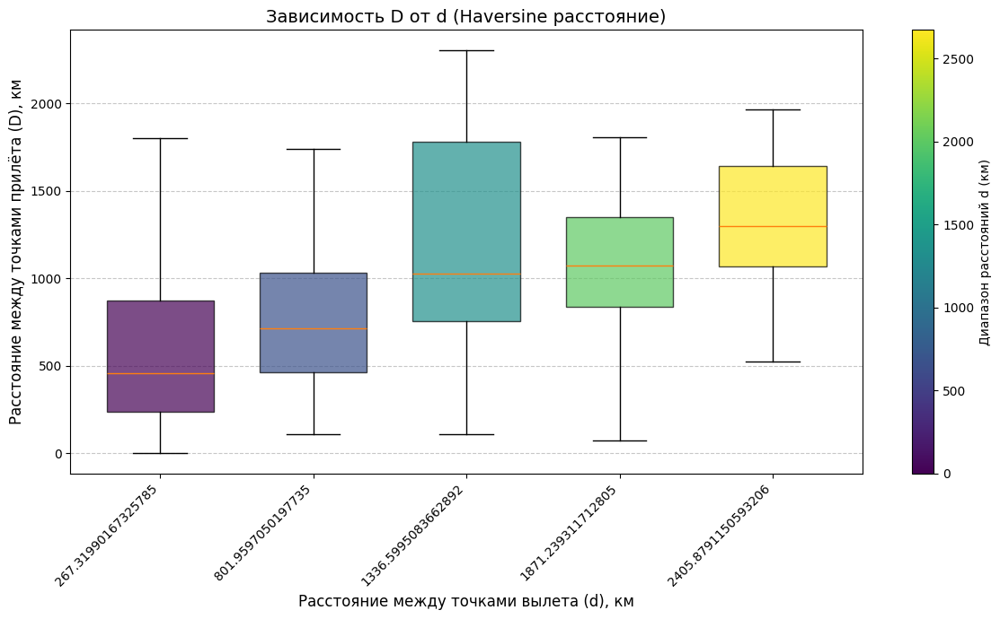

In [ ]:
import json
import random
import numpy as np
import matplotlib.pyplot as plt
from math import radians, sin, cos, sqrt, atan2

def haversine(lon1, lat1, lon2, lat2):
    lon1, lat1, lon2, lat2 = map(radians, [lon1, lat1, lon2, lat2])
    dlon = lon2 - lon1
    dlat = lat2 - lat1
    a = sin(dlat/2)**2 + cos(lat1) * cos(lat2) * sin(dlon/2)**2
    c = 2 * atan2(sqrt(a), sqrt(1-a))
    return 6371 * c

with open('migration_probabilities.json', 'r') as f:
    data = json.load(f)

departure_points = list(data.keys())
departure_probs = [sum(prob for _, prob in data[point]) for point in departure_points]
departure_probs = np.array(departure_probs) / sum(departure_probs)

n_samples = 1000
pairs = []
for _ in range(n_samples):
    pair = random.choices(departure_points, weights=departure_probs, k=2)
    pairs.append(pair)

distances_d = []
distances_D = []

for p1, p2 in pairs:

    lat1, lon1 = map(float, p1.split(','))
    lat2, lon2 = map(float, p2.split(','))

    arrivals_p1 = data[p1]
    points_p1, probs_p1 = zip(*arrivals_p1)
    arrival1 = random.choices(points_p1, weights=probs_p1, k=1)[0]
    alat1, alon1 = map(float, arrival1.split(','))

    arrivals_p2 = data[p2]
    points_p2, probs_p2 = zip(*arrivals_p2)
    arrival2 = random.choices(points_p2, weights=probs_p2, k=1)[0]
    alat2, alon2 = map(float, arrival2.split(','))

    d = haversine(lon1, lat1, lon2, lat2)
    D = haversine(alon1, alat1, alon2, alat2)

    distances_d.append(d)
    distances_D.append(D)

bins = np.linspace(min(distances_d), max(distances_d), 6)
groups = [[] for _ in range(len(bins)-1)]

for d, D in zip(distances_d, distances_D):
    for i in range(len(bins)-1):
        if bins[i] <= d < bins[i+1]:
            groups[i].append(D)
            break

plt.figure(figsize=(12, 7))
box = plt.boxplot(
    groups,
    positions=(bins[:-1] + bins[1:]) / 2,
    widths=np.diff(bins)*0.7,
    patch_artist=True,
    showfliers=False
)

colors = plt.cm.viridis(np.linspace(0, 1, len(groups)))
for patch, color in zip(box['boxes'], colors):
    patch.set_facecolor(color)
    patch.set_alpha(0.7)

plt.xticks(
    rotation=45,
    ha='right',
    fontsize=10
)
plt.xlabel('Расстояние между точками вылета (d), км', fontsize=12)
plt.ylabel('Расстояние между точками прилёта (D), км', fontsize=12)
plt.title('Зависимость D от d (Haversine расстояние)', fontsize=14)
plt.grid(axis='y', linestyle='--', alpha=0.7)

sm = plt.cm.ScalarMappable(cmap='viridis', norm=plt.Normalize(vmin=bins[0], vmax=bins[-1]))
sm.set_array([])
cbar = plt.colorbar(sm, ax=plt.gca())
cbar.set_label('Диапазон расстояний d (км)', fontsize=10)

plt.tight_layout()
plt.show()

In [2]:
pip install mplcursors

Медианы для boxplot:
Бин 1: d = [0.0, 520.2) км -> Медиана D = 444.8 км
Бин 2: d = [520.2, 1040.5) км -> Медиана D = 823.1 км
Бин 3: d = [1040.5, 1560.7) км -> Медиана D = 978.0 км
Бин 4: d = [1560.7, 2080.9) км -> Медиана D = 1091.3 км
Бин 5: d = [2080.9, 2601.1) км -> Медиана D = 1450.6 км


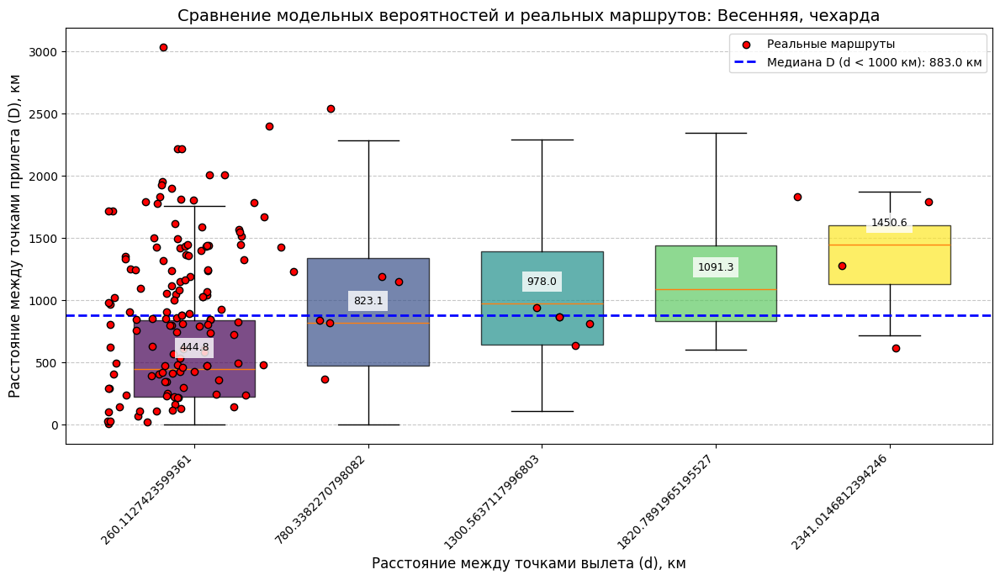

In [47]:
import json
import random
import matplotlib.pyplot as plt
import numpy as np
from math import radians, sin, cos, sqrt, atan2
import mplcursors

def haversine(lon1, lat1, lon2, lat2):
    lon1, lat1, lon2, lat2 = map(radians, [lon1, lat1, lon2, lat2])
    dlon = lon2 - lon1
    dlat = lat2 - lat1
    a = sin(dlat/2)**2 + cos(lat1) * cos(lat2) * sin(dlon/2)**2
    c = 2 * atan2(sqrt(a), sqrt(1-a))
    return 6371 * c


with open('migration_probabilities.json', 'r') as f:
    prob_data = json.load(f)

with open('wintering_to_breeding_routes.json', 'r') as f:
    routes = json.load(f)

# ===== 1. Подготовка данных для boxplot (из migration_probabilities) =====
departure_points = list(prob_data.keys())
departure_probs = [len(v) for v in prob_data.values()]

n_samples = 1000
model_d = []
model_D = []

for _ in range(n_samples):

    p1, p2 = random.choices(departure_points, k=2)

    lat1, lon1 = map(float, p1.split(','))
    lat2, lon2 = map(float, p2.split(','))
    d = haversine(lon1, lat1, lon2, lat2)

    arrival1 = random.choices(
        [x[0] for x in prob_data[p1]],
        weights=[x[1] for x in prob_data[p1]]
    )[0]
    arrival2 = random.choices(
        [x[0] for x in prob_data[p2]],
        weights=[x[1] for x in prob_data[p2]]
    )[0]

    lat_arr1, lon_arr1 = map(float, arrival1.split(','))
    lat_arr2, lon_arr2 = map(float, arrival2.split(','))
    D = haversine(lon_arr1, lat_arr1, lon_arr2, lat_arr2)

    model_d.append(d)
    model_D.append(D)

bins = np.linspace(min(model_d), max(model_d), 6)
groups = []
for i in range(len(bins)-1):
    group = [D for d, D in zip(model_d, model_D) if bins[i] <= d < bins[i+1]]
    groups.append(group)

# ===== 2. Подготовка реальных точек (из wintering_to_breeding) =====
real_d = []
real_D = []
annotations = []

route_list = []
for bird_id, bird_routes in routes.items():
    for route in bird_routes:
        route_list.append(route)

for _ in range(150):
    route1, route2 = random.sample(route_list, 2)

    start1 = route1['start']
    start2 = route2['start']
    d = haversine(
        float(start1['lon']), float(start1['lat']),
        float(start2['lon']), float(start2['lat'])
    )

    end1 = route1['end']
    end2 = route2['end']
    D = haversine(
        float(end1['lon']), float(end1['lat']),
        float(end2['lon']), float(end2['lat'])
    )

    real_d.append(d)
    real_D.append(D)
    annotations.append({
        'd': d,
        'D': D,
        'route1': route1,
        'route2': route2
    })

# ===== 3. График =====
plt.figure(figsize=(12, 7))

box = plt.boxplot(
    groups,
    positions=(bins[:-1] + bins[1:]) / 2,
    widths=np.diff(bins)*0.7,
    patch_artist=True,
    showfliers=False
)

colors = plt.cm.viridis(np.linspace(0, 1, len(groups)))
for patch, color in zip(box['boxes'], colors):
    patch.set_facecolor(color)
    patch.set_alpha(0.7)

scatter = plt.scatter(
    real_d,
    real_D,
    color='red',
    edgecolor='black',
    label='Реальные маршруты',
    zorder=3
)
low_d_points = [(d, D) for d, D in zip(real_d, real_D) if d < 1000]
if low_d_points:
    median_D = np.median([D for d, D in low_d_points])
    plt.axhline(y=median_D, color='blue', linestyle='--', linewidth=2,
                label=f'Медиана D (d < 1000 км): {median_D:.1f} км')


print("Медианы для boxplot:")
for i, group in enumerate(groups):
    if group:
        median_val = np.median(group)
        bin_center = (bins[i] + bins[i+1]) / 2
        print(f"Бин {i+1}: d = [{bins[i]:.1f}, {bins[i+1]:.1f}) км -> Медиана D = {median_val:.1f} км")

        plt.text(
            x=bin_center,
            y=median_val + 0.05*(max(model_D) - min(model_D)),
            s=f'{median_val:.1f}',
            ha='center',
            va='bottom',
            fontsize=9,
            bbox=dict(facecolor='white', alpha=0.8, edgecolor='none')
        )

mplcursors.cursor(scatter, hover=True).connect(
    "add", lambda sel: sel.annotation.set_text(
        f"d: {annotations[sel.index]['d']:.2f} км\n"
        f"D: {annotations[sel.index]['D']:.2f} км\n"
        f"Маршрут 1: {annotations[sel.index]['route1']['start']} → {annotations[sel.index]['route1']['end']}\n"
        f"Маршрут 2: {annotations[sel.index]['route2']['start']} → {annotations[sel.index]['route2']['end']}"
    )
)

plt.xticks(rotation=45, ha='right', fontsize=10)
plt.xlabel('Расстояние между точками вылета (d), км', fontsize=12)
plt.ylabel('Расстояние между точками прилета (D), км', fontsize=12)
plt.title('Сравнение модельных вероятностей и реальных маршрутов: Весенняя, чехарда', fontsize=14)
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

Медианы для boxplot:
Бин 1: d = [0.0, 480.2) км -> Медиана D = 348.3 км
Бин 2: d = [480.2, 960.4) км -> Медиана D = 634.3 км
Бин 3: d = [960.4, 1440.5) км -> Медиана D = 864.7 км
Бин 4: d = [1440.5, 1920.7) км -> Медиана D = 1145.9 км
Бин 5: d = [1920.7, 2400.9) км -> Медиана D = 1517.9 км


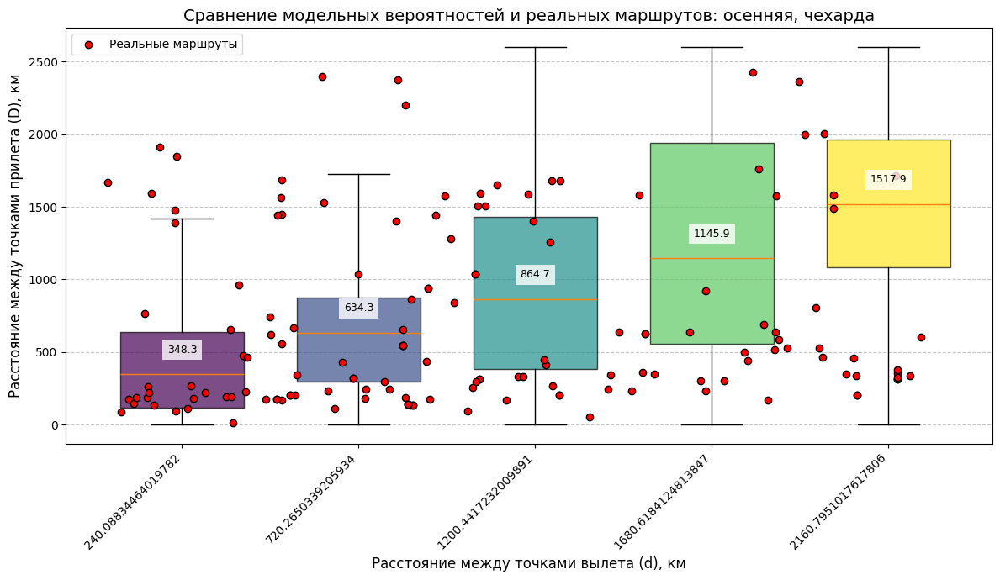

In [90]:
import json
import random
import matplotlib.pyplot as plt
import numpy as np
from math import radians, sin, cos, sqrt, atan2
import mplcursors

def haversine(lon1, lat1, lon2, lat2):
    lon1, lat1, lon2, lat2 = map(radians, [lon1, lat1, lon2, lat2])
    dlon = lon2 - lon1
    dlat = lat2 - lat1
    a = sin(dlat/2)**2 + cos(lat1) * cos(lat2) * sin(dlon/2)**2
    c = 2 * atan2(sqrt(a), sqrt(1-a))
    return 6371 * c

with open('migration_weights_fall.json', 'r') as f:
    prob_data = json.load(f)

with open('breeding_to_wintering_routes.json', 'r') as f:
    routes = json.load(f)

departure_points = list(prob_data.keys())
departure_probs = [len(v) for v in prob_data.values()]


n_samples = 1000
model_d = []
model_D = []

for _ in range(n_samples):

    p1, p2 = random.choices(departure_points, k=2)

    weights_p1 = [x[1] for x in prob_data[p1]]
    weights_p2 = [x[1] for x in prob_data[p2]]

    if sum(weights_p1) <= 0 or sum(weights_p2) <= 0:
        continue
    lat1, lon1 = map(float, p1.split(','))
    lat2, lon2 = map(float, p2.split(','))
    d = haversine(lon1, lat1, lon2, lat2)

    arrival1 = random.choices(
        [x[0] for x in prob_data[p1] if x[1] > 0],
        weights=[x[1] for x in prob_data[p1] if x[1] > 0]
    )[0]

    arrival2 = random.choices(
        [x[0] for x in prob_data[p2] if x[1] > 0],
        weights=[x[1] for x in prob_data[p2] if x[1] > 0]
    )[0]

    lat_arr1, lon_arr1 = map(float, arrival1.split(','))
    lat_arr2, lon_arr2 = map(float, arrival2.split(','))
    D = haversine(lon_arr1, lat_arr1, lon_arr2, lat_arr2)

    model_d.append(d)
    model_D.append(D)


bins = np.linspace(min(model_d), max(model_d), 6)
groups = []
for i in range(len(bins)-1):
    group = [D for d, D in zip(model_d, model_D) if bins[i] <= d < bins[i+1]]
    groups.append(group)

real_d = []
real_D = []
annotations = []

route_list = []
for bird_id, bird_routes in routes.items():
    for route in bird_routes:
        route_list.append(route)

for _ in range(150):
    route1, route2 = random.sample(route_list, 2)

    start1 = route1['start']
    start2 = route2['start']
    d = haversine(
        float(start1['lon']), float(start1['lat']),
        float(start2['lon']), float(start2['lat'])
    )

    end1 = route1['end']
    end2 = route2['end']
    D = haversine(
        float(end1['lon']), float(end1['lat']),
        float(end2['lon']), float(end2['lat'])
    )

    real_d.append(d)
    real_D.append(D)
    annotations.append({
        'd': d,
        'D': D,
        'route1': route1,
        'route2': route2
    })

plt.figure(figsize=(12, 7))

box = plt.boxplot(
    groups,
    positions=(bins[:-1] + bins[1:]) / 2,
    widths=np.diff(bins)*0.7,
    patch_artist=True,
    showfliers=False
)

colors = plt.cm.viridis(np.linspace(0, 1, len(groups)))
for patch, color in zip(box['boxes'], colors):
    patch.set_facecolor(color)
    patch.set_alpha(0.7)

scatter = plt.scatter(
    real_d,
    real_D,
    color='red',
    edgecolor='black',
    label='Реальные маршруты',
    zorder=3
)


print("Медианы для boxplot:")
for i, group in enumerate(groups):
    if group:
        median_val = np.median(group)
        bin_center = (bins[i] + bins[i+1]) / 2
        print(f"Бин {i+1}: d = [{bins[i]:.1f}, {bins[i+1]:.1f}) км -> Медиана D = {median_val:.1f} км")

        plt.text(
            x=bin_center,
            y=median_val + 0.05*(max(model_D) - min(model_D)),
            s=f'{median_val:.1f}',
            ha='center',
            va='bottom',
            fontsize=9,
            bbox=dict(facecolor='white', alpha=0.8, edgecolor='none')
        )

mplcursors.cursor(scatter, hover=True).connect(
    "add", lambda sel: sel.annotation.set_text(
        f"d: {annotations[sel.index]['d']:.2f} км\n"
        f"D: {annotations[sel.index]['D']:.2f} км\n"
        f"Маршрут 1: {annotations[sel.index]['route1']['start']} → {annotations[sel.index]['route1']['end']}\n"
        f"Маршрут 2: {annotations[sel.index]['route2']['start']} → {annotations[sel.index]['route2']['end']}"
    )
)

plt.xticks(rotation=45, ha='right', fontsize=10)
plt.xlabel('Расстояние между точками вылета (d), км', fontsize=12)
plt.ylabel('Расстояние между точками прилета (D), км', fontsize=12)
plt.title('Сравнение модельных вероятностей и реальных маршрутов: осенняя, чехарда', fontsize=14)
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

Медианы для boxplot:
Бин 1: d = [0.0, 501.0) км -> Медиана D = 379.0 км
Бин 2: d = [501.0, 1001.9) км -> Медиана D = 765.8 км
Бин 3: d = [1001.9, 1502.9) км -> Медиана D = 792.7 км
Бин 4: d = [1502.9, 2003.9) км -> Медиана D = 982.6 км
Бин 5: d = [2003.9, 2504.8) км -> Медиана D = 1434.5 км


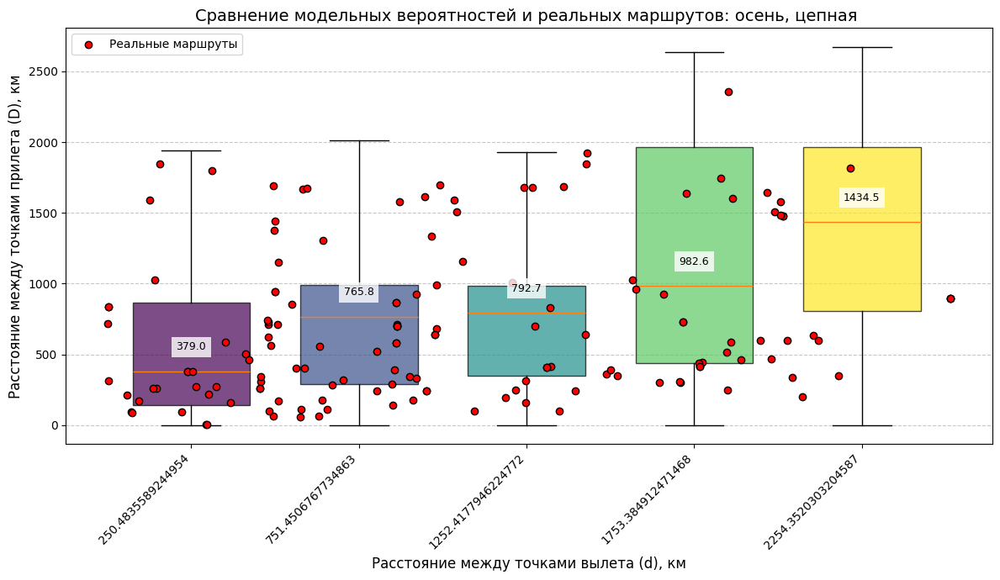

In [93]:
import json
import random
import matplotlib.pyplot as plt
import numpy as np
from math import radians, sin, cos, sqrt, atan2
import mplcursors

def haversine(lon1, lat1, lon2, lat2):
    lon1, lat1, lon2, lat2 = map(radians, [lon1, lat1, lon2, lat2])
    dlon = lon2 - lon1
    dlat = lat2 - lat1
    a = sin(dlat/2)**2 + cos(lat1) * cos(lat2) * sin(dlon/2)**2
    c = 2 * atan2(sqrt(a), sqrt(1-a))
    return 6371 * c

with open('chain_migration_weights_fall.json', 'r') as f:
    prob_data = json.load(f)

with open('breeding_to_wintering_routes.json', 'r') as f:
    routes = json.load(f)

departure_points = list(prob_data.keys())
departure_probs = [len(v) for v in prob_data.values()]


n_samples = 1000
model_d = []
model_D = []

for _ in range(n_samples):

    p1, p2 = random.choices(departure_points, k=2)

    weights_p1 = [x[1] for x in prob_data[p1]]
    weights_p2 = [x[1] for x in prob_data[p2]]

    if sum(weights_p1) <= 0 or sum(weights_p2) <= 0:
        continue
    lat1, lon1 = map(float, p1.split(','))
    lat2, lon2 = map(float, p2.split(','))
    d = haversine(lon1, lat1, lon2, lat2)

    arrival1 = random.choices(
        [x[0] for x in prob_data[p1] if x[1] > 0],
        weights=[x[1] for x in prob_data[p1] if x[1] > 0]
    )[0]

    arrival2 = random.choices(
        [x[0] for x in prob_data[p2] if x[1] > 0],
        weights=[x[1] for x in prob_data[p2] if x[1] > 0]
    )[0]

    lat_arr1, lon_arr1 = map(float, arrival1.split(','))
    lat_arr2, lon_arr2 = map(float, arrival2.split(','))
    D = haversine(lon_arr1, lat_arr1, lon_arr2, lat_arr2)

    model_d.append(d)
    model_D.append(D)

bins = np.linspace(min(model_d), max(model_d), 6)
groups = []
for i in range(len(bins)-1):
    group = [D for d, D in zip(model_d, model_D) if bins[i] <= d < bins[i+1]]
    groups.append(group)

real_d = []
real_D = []
annotations = []

route_list = []
for bird_id, bird_routes in routes.items():
    for route in bird_routes:
        route_list.append(route)

for _ in range(150):
    route1, route2 = random.sample(route_list, 2)

    start1 = route1['start']
    start2 = route2['start']
    d = haversine(
        float(start1['lon']), float(start1['lat']),
        float(start2['lon']), float(start2['lat'])
    )

    end1 = route1['end']
    end2 = route2['end']
    D = haversine(
        float(end1['lon']), float(end1['lat']),
        float(end2['lon']), float(end2['lat'])
    )

    real_d.append(d)
    real_D.append(D)
    annotations.append({
        'd': d,
        'D': D,
        'route1': route1,
        'route2': route2
    })

plt.figure(figsize=(12, 7))

box = plt.boxplot(
    groups,
    positions=(bins[:-1] + bins[1:]) / 2,
    widths=np.diff(bins)*0.7,
    patch_artist=True,
    showfliers=False
)

colors = plt.cm.viridis(np.linspace(0, 1, len(groups)))
for patch, color in zip(box['boxes'], colors):
    patch.set_facecolor(color)
    patch.set_alpha(0.7)

scatter = plt.scatter(
    real_d,
    real_D,
    color='red',
    edgecolor='black',
    label='Реальные маршруты',
    zorder=3
)


print("Медианы для boxplot:")
for i, group in enumerate(groups):
    if group:
        median_val = np.median(group)
        bin_center = (bins[i] + bins[i+1]) / 2
        print(f"Бин {i+1}: d = [{bins[i]:.1f}, {bins[i+1]:.1f}) км -> Медиана D = {median_val:.1f} км")

        plt.text(
            x=bin_center,
            y=median_val + 0.05*(max(model_D) - min(model_D)),
            s=f'{median_val:.1f}',
            ha='center',
            va='bottom',
            fontsize=9,
            bbox=dict(facecolor='white', alpha=0.8, edgecolor='none')
        )

mplcursors.cursor(scatter, hover=True).connect(
    "add", lambda sel: sel.annotation.set_text(
        f"d: {annotations[sel.index]['d']:.2f} км\n"
        f"D: {annotations[sel.index]['D']:.2f} км\n"
        f"Маршрут 1: {annotations[sel.index]['route1']['start']} → {annotations[sel.index]['route1']['end']}\n"
        f"Маршрут 2: {annotations[sel.index]['route2']['start']} → {annotations[sel.index]['route2']['end']}"
    )
)

plt.xticks(rotation=45, ha='right', fontsize=10)
plt.xlabel('Расстояние между точками вылета (d), км', fontsize=12)
plt.ylabel('Расстояние между точками прилета (D), км', fontsize=12)
plt.title('Сравнение модельных вероятностей и реальных маршрутов: осень, цепная ', fontsize=14)
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

Медианы для boxplot:
Бин 1: d = [0.0, 534.6) км -> Медиана D = 373.7 км
Бин 2: d = [534.6, 1069.3) км -> Медиана D = 803.5 км
Бин 3: d = [1069.3, 1603.9) км -> Медиана D = 1015.0 км
Бин 4: d = [1603.9, 2138.6) км -> Медиана D = 1410.4 км
Бин 5: d = [2138.6, 2673.2) км -> Медиана D = 1642.3 км


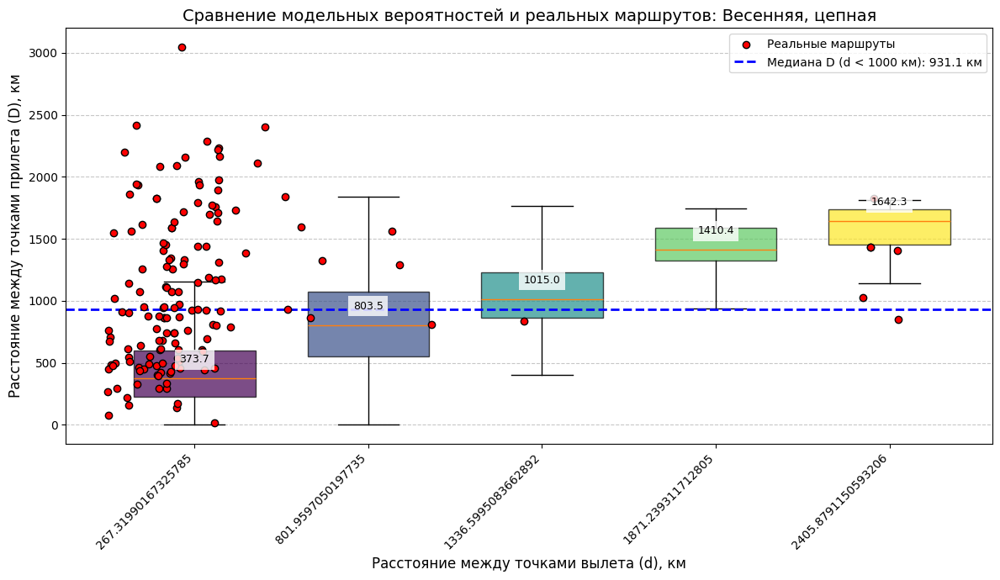

In [94]:
import json
import random
import matplotlib.pyplot as plt
import numpy as np
from math import radians, sin, cos, sqrt, atan2
import mplcursors

def haversine(lon1, lat1, lon2, lat2):
    lon1, lat1, lon2, lat2 = map(radians, [lon1, lat1, lon2, lat2])
    dlon = lon2 - lon1
    dlat = lat2 - lat1
    a = sin(dlat/2)**2 + cos(lat1) * cos(lat2) * sin(dlon/2)**2
    c = 2 * atan2(sqrt(a), sqrt(1-a))
    return 6371 * c


with open('chain_migration_probabilities.json', 'r') as f:
    prob_data = json.load(f)

with open('wintering_to_breeding_routes.json', 'r') as f:
    routes = json.load(f)

departure_points = list(prob_data.keys())
departure_probs = [len(v) for v in prob_data.values()]

n_samples = 1000
model_d = []
model_D = []

for _ in range(n_samples):
    valid_points = [p for p in departure_points
                   if any(w > 0 for _, w in prob_data[p])]

    if len(valid_points) < 2:
        print("Недостаточно точек с ненулевыми вероятностями")
        break

    p1, p2 = random.choices(valid_points, k=2)

    arrivals1 = [(x[0], x[1]) for x in prob_data[p1] if x[1] > 0]
    arrivals2 = [(x[0], x[1]) for x in prob_data[p2] if x[1] > 0]

    if not arrivals1 or not arrivals2:
        continue

    arrival1 = random.choices(
        [x[0] for x in arrivals1],
        weights=[x[1] for x in arrivals1]
    )[0]
    arrival2 = random.choices(
        [x[0] for x in arrivals2],
        weights=[x[1] for x in arrivals2]
    )[0]

    lat1, lon1 = map(float, p1.split(','))
    lat2, lon2 = map(float, p2.split(','))
    d = haversine(lon1, lat1, lon2, lat2)

    lat_arr1, lon_arr1 = map(float, arrival1.split(','))
    lat_arr2, lon_arr2 = map(float, arrival2.split(','))
    D = haversine(lon_arr1, lat_arr1, lon_arr2, lat_arr2)

    model_d.append(d)
    model_D.append(D)

bins = np.linspace(min(model_d), max(model_d), 6)
groups = []
for i in range(len(bins)-1):
    group = [D for d, D in zip(model_d, model_D) if bins[i] <= d < bins[i+1]]
    groups.append(group)


real_d = []
real_D = []
annotations = []

route_list = []
for bird_id, bird_routes in routes.items():
    for route in bird_routes:
        route_list.append(route)

for _ in range(150):
    route1, route2 = random.sample(route_list, 2)

    start1 = route1['start']
    start2 = route2['start']
    d = haversine(
        float(start1['lon']), float(start1['lat']),
        float(start2['lon']), float(start2['lat'])
    )

    end1 = route1['end']
    end2 = route2['end']
    D = haversine(
        float(end1['lon']), float(end1['lat']),
        float(end2['lon']), float(end2['lat'])
    )

    real_d.append(d)
    real_D.append(D)
    annotations.append({
        'd': d,
        'D': D,
        'route1': route1,
        'route2': route2
    })

plt.figure(figsize=(12, 7))

box = plt.boxplot(
    groups,
    positions=(bins[:-1] + bins[1:]) / 2,
    widths=np.diff(bins)*0.7,
    patch_artist=True,
    showfliers=False
)

colors = plt.cm.viridis(np.linspace(0, 1, len(groups)))
for patch, color in zip(box['boxes'], colors):
    patch.set_facecolor(color)
    patch.set_alpha(0.7)

scatter = plt.scatter(
    real_d,
    real_D,
    color='red',
    edgecolor='black',
    label='Реальные маршруты',
    zorder=3
)
low_d_points = [(d, D) for d, D in zip(real_d, real_D) if d < 1000]
if low_d_points:
    median_D = np.median([D for d, D in low_d_points])
    plt.axhline(y=median_D, color='blue', linestyle='--', linewidth=2,
                label=f'Медиана D (d < 1000 км): {median_D:.1f} км')


print("Медианы для boxplot:")
for i, group in enumerate(groups):
    if group:
        median_val = np.median(group)
        bin_center = (bins[i] + bins[i+1]) / 2
        print(f"Бин {i+1}: d = [{bins[i]:.1f}, {bins[i+1]:.1f}) км -> Медиана D = {median_val:.1f} км")

        plt.text(
            x=bin_center,
            y=median_val + 0.05*(max(model_D) - min(model_D)),
            s=f'{median_val:.1f}',
            ha='center',
            va='bottom',
            fontsize=9,
            bbox=dict(facecolor='white', alpha=0.8, edgecolor='none')
        )

mplcursors.cursor(scatter, hover=True).connect(
    "add", lambda sel: sel.annotation.set_text(
        f"d: {annotations[sel.index]['d']:.2f} км\n"
        f"D: {annotations[sel.index]['D']:.2f} км\n"
        f"Маршрут 1: {annotations[sel.index]['route1']['start']} → {annotations[sel.index]['route1']['end']}\n"
        f"Маршрут 2: {annotations[sel.index]['route2']['start']} → {annotations[sel.index]['route2']['end']}"
    )
)

plt.xticks(rotation=45, ha='right', fontsize=10)
plt.xlabel('Расстояние между точками вылета (d), км', fontsize=12)
plt.ylabel('Расстояние между точками прилета (D), км', fontsize=12)
plt.title('Сравнение модельных вероятностей и реальных маршрутов: Весенняя, цепная', fontsize=14)
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

In [ ]:
import json
import folium
import numpy as np
from branca.colormap import linear
from collections import defaultdict
from google.colab import files

with open('/content/wintering_to_breeding_routes.json', 'r') as f:
    routes = json.load(f)

BREEDING_COLOR = '#1f77b4'
WINTERING_COLOR = '#ff7f0e'

all_breeding = []
all_wintering = []

for bird_id, bird_routes in routes.items():
    for route in bird_routes:

        lat = float(route['start']['lat'])
        lon = float(route['start']['lon'])
        all_wintering.append((lat, lon))


        lat = float(route['end']['lat'])
        lon = float(route['end']['lon'])
        all_breeding.append((lat, lon))


center_lat = np.mean([p[0] for p in all_breeding + all_wintering])
center_lon = np.mean([p[1] for p in all_breeding + all_wintering])


m = folium.Map(
    location=[center_lat, center_lon],
    zoom_start=5,
    tiles='CartoDB positron',
    width='100%',
    height='70%'
)

for lat, lon in set(all_wintering):
    folium.Rectangle(
        bounds=[
            [lat - 0.5, lon - 0.5],
            [lat + 0.5, lon + 0.5]
        ],
        color=WINTERING_COLOR,
        fill=True,
        fill_opacity=0.7,
        popup=f'Wintering: ({lat:.2f}, {lon:.2f})',
        tooltip='Зимовка'
    ).add_to(m)

for lat, lon in set(all_breeding):
    folium.Rectangle(
        bounds=[
            [lat - 0.5, lon - 0.5],
            [lat + 0.5, lon + 0.5]
        ],
        color=BREEDING_COLOR,
        fill=True,
        fill_opacity=0.7,
        popup=f'Breeding: ({lat:.2f}, {lon:.2f})',
        tooltip='Гнездование'
    ).add_to(m)

legend_html = '''
<div style="
  position: fixed;
  bottom: 50px;
  left: 50px;
  width: 150px;
  height: 80px;
  border:2px solid grey;
  z-index:9999;
  font-size:14px;
  background-color:white;
  padding: 10px;
">
  <b>Легенда:</b><br>
  <i class="fa fa-square" style="color:{breed}"></i> Гнездование<br>
  <i class="fa fa-square" style="color:{wint}"></i> Зимовка
</div>
'''.format(breed=BREEDING_COLOR, wint=WINTERING_COLOR)

m.get_root().html.add_child(folium.Element(legend_html))

display(m)

In [95]:
import json
import numpy as np
import folium
import matplotlib.pyplot as plt
import matplotlib.colors as colors
from branca.colormap import LinearColormap
from IPython.display import display

def load_migration_data(file_path):
    with open(file_path, 'r') as f:
        return json.load(f)

def is_point_on_segment(lat_p, lon_p, lat1, lon1, lat2, lon2, tolerance=1e-9):
    cross = (lon_p - lon1) * (lat2 - lat1) - (lat_p - lat1) * (lon2 - lon1)
    if abs(cross) > tolerance:
        return False
    return (min(lat1, lat2) - tolerance <= lat_p <= max(lat1, lat2) + tolerance and
            min(lon1, lon2) - tolerance <= lon_p <= max(lon1, lon2) + tolerance)

def find_destination_routes(data, lat_p, lon_p):
    destinations = []
    weights = []
    for start, routes in data.items():
        lat1, lon1 = map(float, start.split(','))
        for end, weight in routes:
            lat2, lon2 = map(float, end[0].split(',')) if isinstance(end, list) else map(float, end.split(','))
            if is_point_on_segment(lat_p, lon_p, lat1, lon1, lat2, lon2):
                destinations.append((lat2, lon2, float(weight) if isinstance(weight, (str, list)) else weight))
                weights.append(float(weight) if isinstance(weight, (str, list)) else weight)
    return destinations, np.array(weights)

def create_log_colormap(weights, cmap_name='viridis'):
    non_zero_weights = weights[weights > 0]
    min_weight = non_zero_weights.min()
    max_weight = weights.max()

    cmap = plt.colormaps[cmap_name]
    norm = colors.LogNorm(vmin=min_weight, vmax=max_weight)

    def value_to_color(val):
        if val <= 0:
            return '#808080'
        return colors.rgb2hex(cmap(norm(val)))

    return value_to_color, norm

def plot_destination_routes(center_lat, center_lon, destinations, weights):
    m = folium.Map(location=[center_lat, center_lon], zoom_start=5, tiles='CartoDB positron')

    color_func, norm = create_log_colormap(weights)

    for lat, lon, weight in destinations:
        folium.PolyLine(
            locations=[(center_lat, center_lon), (lat, lon)],
            color=color_func(weight),
            weight=2 + 3 * (weight / weights.max()),
            opacity=0.7,
            popup=f"Вес: {weight:.2e}"
        ).add_to(m)

        folium.CircleMarker(
            location=[lat, lon],
            radius=3 + 5 * (weight / weights.max()),
            color=color_func(weight),
            fill=True,
            popup=f"Конечная точка: {lat:.2f}°N, {lon:.2f}°W"
        ).add_to(m)


    folium.Marker(
        [center_lat, center_lon],
        popup=f"Выбранная точка ({center_lat:.2f}°N, {center_lon:.2f}°W)",
        icon=folium.Icon(color='red', icon='star')
    ).add_to(m)


    LinearColormap(
        colors=['#440154', '#3b528b', '#21918c', '#5ec962', '#fde725'],
        vmin=norm.vmin,
        vmax=norm.vmax,
        caption='Log10 Weight Scale'
    ).add_to(m)

    return m

file_path = "migration_weights.json"
data = load_migration_data(file_path)

center_lat, center_lon = 33.5, -81.5 #один радиус


destinations, weights = find_destination_routes(data, center_lat, center_lon)


print(f"Найдено {len(destinations)} маршрутов через точку ({center_lat}, {center_lon})")
map_obj = plot_destination_routes(center_lat, center_lon, destinations, weights)
display(map_obj)

Найдено 43 маршрутов через точку (33.5, -81.5)


In [96]:
import json
import numpy as np
import folium
import matplotlib.pyplot as plt
import matplotlib.colors as colors
from branca.colormap import LinearColormap
from IPython.display import display

def load_migration_data(file_path):
    with open(file_path, 'r') as f:
        return json.load(f)

def is_point_on_segment(lat_p, lon_p, lat1, lon1, lat2, lon2, tolerance=1e-9):
    cross = (lon_p - lon1) * (lat2 - lat1) - (lat_p - lat1) * (lon2 - lon1)
    if abs(cross) > tolerance:
        return False
    return (min(lat1, lat2) - tolerance <= lat_p <= max(lat1, lat2) + tolerance and
            min(lon1, lon2) - tolerance <= lon_p <= max(lon1, lon2) + tolerance)

def find_destination_routes(data, lat_p, lon_p):
    destinations = []
    weights = []
    for start, routes in data.items():
        lat1, lon1 = map(float, start.split(','))
        for end, weight in routes:
            lat2, lon2 = map(float, end[0].split(',')) if isinstance(end, list) else map(float, end.split(','))
            if is_point_on_segment(lat_p, lon_p, lat1, lon1, lat2, lon2):
                destinations.append((lat2, lon2, float(weight) if isinstance(weight, (str, list)) else weight))
                weights.append(float(weight) if isinstance(weight, (str, list)) else weight)
    return destinations, np.array(weights)

def create_log_colormap(weights, cmap_name='viridis'):
    non_zero_weights = weights[weights > 0]
    min_weight = non_zero_weights.min()
    max_weight = weights.max()

    cmap = plt.colormaps[cmap_name]
    norm = colors.LogNorm(vmin=min_weight, vmax=max_weight)

    def value_to_color(val):
        if val <= 0:
            return '#808080'
        return colors.rgb2hex(cmap(norm(val)))

    return value_to_color, norm

def plot_destination_routes(center_lat, center_lon, destinations, weights):
    m = folium.Map(location=[center_lat, center_lon], zoom_start=5, tiles='CartoDB positron')


    color_func, norm = create_log_colormap(weights)

    for lat, lon, weight in destinations:
        folium.PolyLine(
            locations=[(center_lat, center_lon), (lat, lon)],
            color=color_func(weight),
            weight=2 + 3 * (weight / weights.max()),
            opacity=0.7,
            popup=f"Вес: {weight:.2e}"
        ).add_to(m)

        folium.CircleMarker(
            location=[lat, lon],
            radius=3 + 5 * (weight / weights.max()),
            color=color_func(weight),
            fill=True,
            popup=f"Конечная точка: {lat:.2f}°N, {lon:.2f}°W"
        ).add_to(m)

    folium.Marker(
        [center_lat, center_lon],
        popup=f"Выбранная точка ({center_lat:.2f}°N, {center_lon:.2f}°W)",
        icon=folium.Icon(color='red', icon='star')
    ).add_to(m)

    LinearColormap(
        colors=['#440154', '#3b528b', '#21918c', '#5ec962', '#fde725'],
        vmin=norm.vmin,
        vmax=norm.vmax,
        caption='Log10 Weight Scale'
    ).add_to(m)

    return m

file_path = "migration_weights.json"
data = load_migration_data(file_path)

center_lat = float(input("Введите широту точки (например, 33.5): "))
center_lon = float(input("Введите долготу точки (например, -81.5): "))

destinations, weights = find_destination_routes(data, center_lat, center_lon)

print(f"Найдено {len(destinations)} маршрутов через точку ({center_lat}, {center_lon})")
map_obj = plot_destination_routes(center_lat, center_lon, destinations, weights)
display(map_obj)


Введите широту точки (например, 33.5): 33.5
Введите долготу точки (например, -81.5): -87.5
Найдено 64 маршрутов через точку (33.5, -87.5)


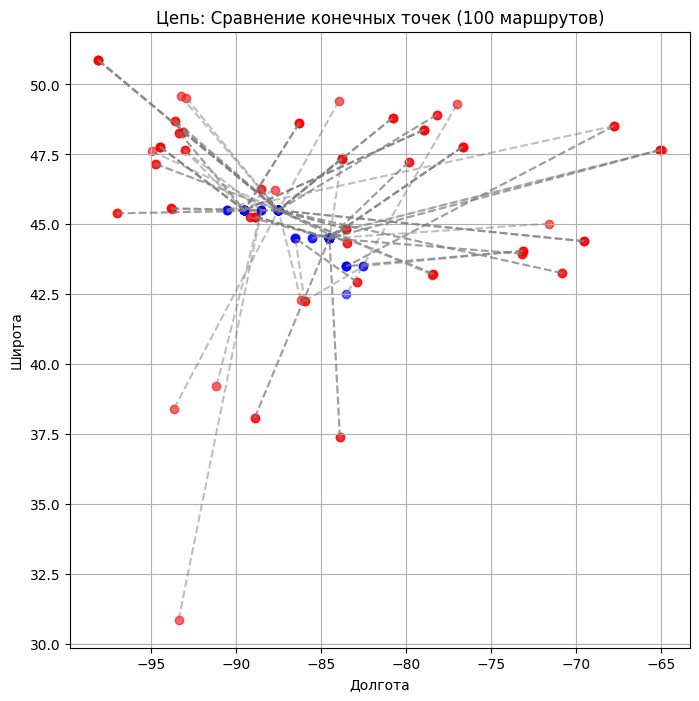

In [69]:
import json
import random
import matplotlib.pyplot as plt
import numpy as np
from math import radians, sin, cos, sqrt, atan2

def haversine(lon1, lat1, lon2, lat2):
    lon1, lat1, lon2, lat2 = map(radians, [lon1, lat1, lon2, lat2])
    dlon = lon2 - lon1
    dlat = lat2 - lat1
    a = sin(dlat/2)**2 + cos(lat1) * cos(lat2) * sin(dlon/2)**2
    c = 2 * atan2(sqrt(a), sqrt(1-a))
    return 6371 * c

with open('chain_migration_probabilities.json', 'r') as f:
    prob_data = json.load(f)

with open('wintering_to_breeding_routes.json', 'r') as f:
    routes = json.load(f)

real_points = []
model_points = []
distances = []

for _ in range(100):
    random_route = random.choice([route for bird in routes.values() for route in bird])
    start_point = f"{random_route['start']['lat']},{random_route['start']['lon']}"
    end_point = f"{random_route['end']['lat']},{random_route['end']['lon']}"

    departure_points = list(prob_data.keys())
    closest_departure = min(departure_points, key=lambda p: haversine(
        float(p.split(',')[1]), float(p.split(',')[0]),
        float(random_route['start']['lon']), float(random_route['start']['lat'])
    ))

    arrival_candidates = [(x[0], x[1]) for x in prob_data[closest_departure] if x[1] > 0]

    if not arrival_candidates:
        continue

    arrival_point = random.choices(
        [x[0] for x in arrival_candidates],
        weights=[x[1] for x in arrival_candidates]
    )[0]

    lat_model, lon_model = map(float, arrival_point.split(','))
    lat_real, lon_real = map(float, end_point.split(','))
    distance = haversine(lon_model, lat_model, lon_real, lon_real)

    real_points.append((lon_real, lat_real))
    model_points.append((lon_model, lat_model))
    distances.append(distance)

plt.figure(figsize=(8, 8))
for (lon_real, lat_real), (lon_model, lat_model) in zip(real_points, model_points):
    plt.scatter(lon_real, lat_real, color='red', alpha=0.6)
    plt.scatter(lon_model, lat_model, color='blue', alpha=0.6)
    plt.plot([lon_real, lon_model], [lat_real, lat_model], linestyle='--', color='gray', alpha=0.5)

plt.xlabel('Долгота')
plt.ylabel('Широта')
plt.title('Цепь: Сравнение конечных точек (100 маршрутов)')
plt.grid()
plt.show()


In [68]:
import json
import random
import folium
from math import radians, sin, cos, sqrt, atan2

def haversine(lon1, lat1, lon2, lat2):
    lon1, lat1, lon2, lat2 = map(radians, [lon1, lat1, lon2, lat2])
    dlon = lon2 - lon1
    dlat = lat2 - lat1
    a = sin(dlat/2)**2 + cos(lat1) * cos(lat2) * sin(dlon/2)**2
    c = 2 * atan2(sqrt(a), sqrt(1-a))
    return 6371 * c

# Загружаем данные
with open('migration_probabilities.json', 'r') as f:
    prob_data = json.load(f)

with open('wintering_to_breeding_routes.json', 'r') as f:
    routes = json.load(f)

# Нормализация вероятностей
for departure, arrivals in prob_data.items():
    total_prob = sum(prob for _, prob in arrivals)
    if total_prob > 0:
        prob_data[departure] = [(dest, prob / total_prob) for dest, prob in arrivals]

# Начальная позиция карты
map_center = [20, 0]
m = folium.Map(location=map_center, zoom_start=2)

for _ in range(10):
    # Выбираем случайный маршрут
    random_route = random.choice([route for bird in routes.values() for route in bird])
    start_point = f"{random_route['start']['lat']},{random_route['start']['lon']}"
    end_point = f"{random_route['end']['lat']},{random_route['end']['lon']}"

    # Находим ближайшую точку вылета из migration_probabilities
    departure_points = list(prob_data.keys())
    closest_departure = min(departure_points, key=lambda p: haversine(
        float(p.split(',')[1]), float(p.split(',')[0]),
        float(random_route['start']['lon']), float(random_route['start']['lat'])
    ))

    # Фильтруем точки прилета с ненулевыми вероятностями
    arrival_candidates = [(x[0], x[1]) for x in prob_data[closest_departure] if x[1] > 0]

    if not arrival_candidates:
        continue

    # Выбираем точку с наибольшей вероятностью
    arrival_point, max_probability = max(arrival_candidates, key=lambda x: x[1])

    # Вывод максимальной вероятности
    print(f"Маршрут {start_point} -> {end_point}")
    print(f"Предсказанный маршрут {closest_departure} -> {arrival_point} с вероятностью {max_probability:.4f}\n")

    # Координаты
    lat_model, lon_model = map(float, arrival_point.split(','))
    lat_real, lon_real = map(float, end_point.split(','))

    # Рисуем маршруты
    folium.PolyLine(
        locations=[[random_route['start']['lat'], random_route['start']['lon']],
                   [random_route['end']['lat'], random_route['end']['lon']]],
        color="blue", weight=2.5, opacity=0.7, dash_array='5, 5').add_to(m)

    folium.PolyLine(
        locations=[[float(closest_departure.split(',')[0]), float(closest_departure.split(',')[1])],
                   [lat_model, lon_model]],
        color="red", weight=2.5, opacity=0.7, dash_array='5, 5').add_to(m)

    # Добавляем точки маршрута
    folium.CircleMarker(
        location=[random_route['start']['lat'], random_route['start']['lon']],
        radius=5, color='green', fill=True, fill_color='green', fill_opacity=0.7
    ).add_to(m)

    folium.CircleMarker(
        location=[random_route['end']['lat'], random_route['end']['lon']],
        radius=5, color='purple', fill=True, fill_color='purple', fill_opacity=0.7
    ).add_to(m)

    folium.CircleMarker(
        location=[lat_model, lon_model],
        radius=5, color='blue', fill=True, fill_color='blue', fill_opacity=0.7
    ).add_to(m)

    folium.PolyLine(
        locations=[[float(closest_departure.split(',')[0]), float(closest_departure.split(',')[1])], [lat_model, lon_model]],
        color="orange", weight=2, opacity=0.6
    ).add_to(m)

# Сохранение карты
m.save('migration_routes_map.html')

# Для отображения карты в Jupyter
m


Маршрут 32.036,-91.35000000000002 -> 47.771,-76.67599999999999
Предсказанный маршрут 32.5,-91.5 -> 48.5,-91.5 с вероятностью 0.9775

Маршрут 32.6506119,-94.151741 -> 48.705,-93.56799999999998
Предсказанный маршрут 32.5,-94.5 -> 50.5,-94.5 с вероятностью 0.9775

Маршрут 31.241,-92.733 -> 47.372,-83.75400000000002
Предсказанный маршрут 31.5,-93.5 -> 48.5,-68.5 с вероятностью 0.9775

Маршрут 31.872,-93.63099999999996 -> 48.923,-78.17099999999999
Предсказанный маршрут 31.5,-93.5 -> 48.5,-68.5 с вероятностью 0.9775

Маршрут 31.658,-95.579 -> 46.308,-88.46299999999997
Предсказанный маршрут 31.5,-94.5 -> 48.5,-67.5 с вероятностью 0.9775

Маршрут 32.664,-94.163 -> 47.158,-94.68399999999995
Предсказанный маршрут 32.5,-94.5 -> 50.5,-94.5 с вероятностью 0.9775

Маршрут 31.284,-92.65699999999998 -> 43.253,-70.82
Предсказанный маршрут 31.5,-93.5 -> 48.5,-68.5 с вероятностью 0.9775

Маршрут 30.489,-91.688 -> 44.035,-78.55599999999998
Предсказанный маршрут 30.5,-91.5 -> 48.5,-68.5 с вероятностью 0.97

In [97]:
import json
import random
import folium
from math import radians, sin, cos, sqrt, atan2

def haversine(lon1, lat1, lon2, lat2):
    lon1, lat1, lon2, lat2 = map(radians, [lon1, lat1, lon2, lat2])
    dlon = lon2 - lon1
    dlat = lat2 - lat1
    a = sin(dlat/2)**2 + cos(lat1) * cos(lat2) * sin(dlon/2)**2
    c = 2 * atan2(sqrt(a), sqrt(1-a))
    return 6371 * c

with open('chain_migration_probabilities.json', 'r') as f:
    prob_data = json.load(f)

with open('wintering_to_breeding_routes.json', 'r') as f:
    routes = json.load(f)

for departure, arrivals in prob_data.items():
    total_prob = sum(prob for _, prob in arrivals)
    if total_prob > 0:
        prob_data[departure] = [(dest, prob / total_prob) for dest, prob in arrivals]
map_center = [20, 0]
m = folium.Map(location=map_center, zoom_start=2)

for _ in range(10):
    random_route = random.choice([route for bird in routes.values() for route in bird])
    start_point = f"{random_route['start']['lat']},{random_route['start']['lon']}"
    end_point = f"{random_route['end']['lat']},{random_route['end']['lon']}"

    departure_points = list(prob_data.keys())
    closest_departure = min(departure_points, key=lambda p: haversine(
        float(p.split(',')[1]), float(p.split(',')[0]),
        float(random_route['start']['lon']), float(random_route['start']['lat'])
    ))

    arrival_candidates = [(x[0], x[1]) for x in prob_data[closest_departure] if x[1] > 0]

    if not arrival_candidates:
        continue

    arrival_point, max_probability = max(arrival_candidates, key=lambda x: x[1])

    lat_model, lon_model = map(float, arrival_point.split(','))
    lat_real, lon_real = map(float, end_point.split(','))

    folium.PolyLine(
        locations=[[random_route['start']['lat'], random_route['start']['lon']],
                   [random_route['end']['lat'], random_route['end']['lon']]],
        color="blue", weight=2.5, opacity=0.7, dash_array='5, 5').add_to(m)

    folium.PolyLine(
        locations=[[float(closest_departure.split(',')[0]), float(closest_departure.split(',')[1])],
                   [lat_model, lon_model]],
        color="red", weight=2.5, opacity=0.7, dash_array='5, 5').add_to(m)

    folium.CircleMarker(
        location=[random_route['start']['lat'], random_route['start']['lon']],
        radius=5, color='green', fill=True, fill_color='green', fill_opacity=0.7
    ).add_to(m)

    folium.CircleMarker(
        location=[random_route['end']['lat'], random_route['end']['lon']],
        radius=5, color='purple', fill=True, fill_color='purple', fill_opacity=0.7
    ).add_to(m)

    folium.CircleMarker(
        location=[lat_model, lon_model],
        radius=5, color='blue', fill=True, fill_color='blue', fill_opacity=0.7
    ).add_to(m)

    folium.PolyLine(
        locations=[[float(closest_departure.split(',')[0]), float(closest_departure.split(',')[1])], [lat_model, lon_model]],
        color="orange", weight=2, opacity=0.6
    ).add_to(m)

m.save('migration_routes_map.html')

m


In [98]:
import json
import numpy as np

def load_data(filename):
    with open(filename, 'r') as f:
        return json.load(f)

def normalize_probabilities(data):
    for source_point, routes in data.items():
        probabilities = [prob for _, prob in routes]

        min_prob = min(probabilities)
        max_prob = max(probabilities)

        if max_prob > min_prob:
            for i, (target_point, prob) in enumerate(routes):
                normalized_prob = (prob - min_prob) / (max_prob - min_prob)
                routes[i] = (target_point, normalized_prob)
        else:
            for i, (target_point, prob) in enumerate(routes):
                routes[i] = (target_point, 0.5)

    return data

def calculate_likelihood(data):
    likelihood = defaultdict(float)
    for source_point, routes in data.items():
        product_prob = 1
        for target_point, prob in routes:
            if prob > 0:
                product_prob *= prob
        likelihood[source_point] = product_prob
    return likelihood

def compare_models(migration_probs, chain_probs):
    ll_migration = calculate_likelihood(migration_probs)
    ll_chain = calculate_likelihood(chain_probs)

    total_ll_migration = sum(ll_migration.values())
    total_ll_chain = sum(ll_chain.values())

    likelihood_ratio = total_ll_migration / total_ll_chain
    print(total_ll_migration, total_ll_chain)
    support_migration = 0
    support_chain = 0
    neutral = 0

    ratios = {}
    for point in ll_migration:
        chain_prob = ll_chain.get(point, 1e-10)
        ratio = ll_migration[point] / (chain_prob + 1e-10)
        ratios[point] = ratio

        if ratio > 1.5:
            support_migration += 1
        elif ratio < 0.5:
            support_chain += 1
        else:
            neutral += 1

    return {
        'likelihood_ratio': likelihood_ratio,
        'support_migration': support_migration,
        'support_chain': support_chain,
        'neutral': neutral,
        'total_routes': len(ll_migration),
        'ratios': ratios
    }
migration_probs = load_data("migration_probabilities.json")
chain_probs = load_data("chain_migration_probabilities.json")

migration_probs_normalized = normalize_probabilities(migration_probs)
chain_probs_normalized = normalize_probabilities(chain_probs)

with open('migration_probabilities_normalized.json', 'w') as f:
    json.dump(migration_probs_normalized, f, indent=4)

with open('chain_migration_probabilities_normalized.json', 'w') as f:
    json.dump(chain_probs_normalized, f, indent=4)

results_normalized = compare_models(migration_probs_normalized, chain_probs_normalized)


0.05030233650265495 2.9046894650122774e-07
